# 2.5. Tại sao Search Gradients thông thường thất bại ?





Start: Mu=3.0, Sigma=1.0
----------------------------------------
!!! HỆ THỐNG SẬP VÌ SIGMA QUÁ NHỎ TẠI BƯỚC 252 !!!


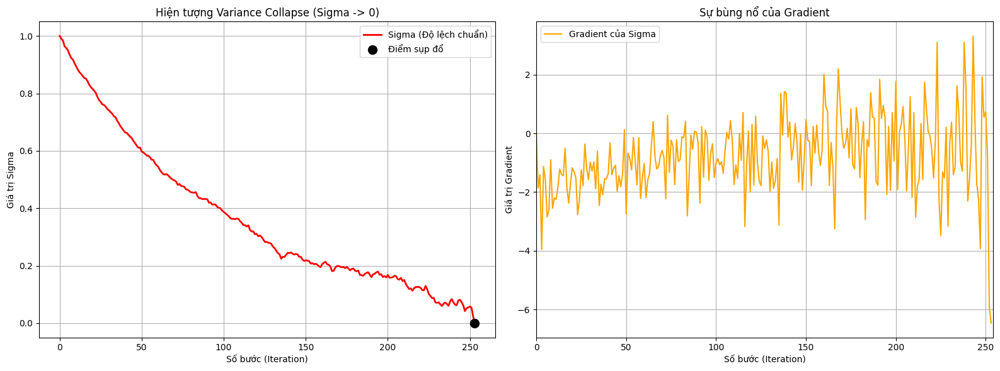

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def demonstrate_variance_collapse():
    n_iterations = 1000
    learning_rate = 0.005
    batch_size = 1000

    mu = 3.0
    sigma = 1.0

    history_sigma = [sigma]
    history_grad_sigma = [0]

    print(f"Start: Mu={mu}, Sigma={sigma}")
    print("-" * 40)

    crashed = False
    crash_step = 0

    for i in range(n_iterations):
        try:
            z = np.random.normal(mu, sigma, batch_size)

            # R = 5 - (khoảng cách)^2.
            rewards = 5.0 - (z**2)
            # Grad_log_sigma = ((z - mu)^2 - sigma^2) / sigma^3
            grad_log_sigma = ((z - mu)**2 - sigma**2) / (sigma**3)

            # Vanilla Gradient Update = mean(grad_log * reward)
            grad_sigma_final = np.mean(grad_log_sigma * rewards)

            if np.abs(grad_sigma_final) > 1000:
                print(f"!!! CẢNH BÁO BÙNG NỔ TẠI BƯỚC {i} !!!")
                print(f"Sigma hiện tại: {sigma:.5f}")
                print(f"Gradient Sigma vọt lên: {grad_sigma_final:.2f}")
                crashed = True
                crash_step = i
                # Vẫn lưu để vẽ biểu đồ rồi break
                history_sigma.append(sigma)
                history_grad_sigma.append(grad_sigma_final)
                break

            # Cập nhật
            sigma += learning_rate * grad_sigma_final

            # Sigma quá nhỏ
            if sigma <= 0.001:
                print(f"!!! HỆ THỐNG SẬP VÌ SIGMA QUÁ NHỎ TẠI BƯỚC {i} !!!")
                crashed = True
                crash_step = i
                history_sigma.append(0) # Về 0
                history_grad_sigma.append(grad_sigma_final)
                break

            history_sigma.append(sigma)
            history_grad_sigma.append(grad_sigma_final)

        except Exception as e:
            print(f"Lỗi tính toán: {e}")
            break

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    ax1.plot(history_sigma, label='Sigma (Độ lệch chuẩn)', color='red', linewidth=2)
    if crashed:
        ax1.scatter(crash_step + 1, history_sigma[-1], color='black', s=100, label='Điểm sụp đổ', zorder=5)
    ax1.set_title('Hiện tượng Variance Collapse (Sigma -> 0)')
    ax1.set_xlabel('Số bước (Iteration)')
    ax1.set_ylabel('Giá trị Sigma')
    ax1.legend()
    ax1.grid(True)

    # Biểu đồ 2
    ax2.plot(history_grad_sigma, label='Gradient của Sigma', color='orange')
    ax2.set_title('Sự bùng nổ của Gradient')
    ax2.set_xlabel('Số bước (Iteration)')
    ax2.set_ylabel('Giá trị Gradient')

    if crashed and crash_step > 5:
        ax2.set_xlim(0, crash_step + 2)

    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

demonstrate_variance_collapse()

# Demo Ma trận Fisher


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

BETA = 20.0

def gradient(theta):
    return np.array([theta[0], BETA * theta[1]])

def fisher_matrix():
    return np.array([[1.0, 0.0], [0.0, BETA]])

start_pos = [-9.0, 2.0]

path_gd = [np.array(start_pos)]
curr = np.array(start_pos)
lr_gd = 1.8 / BETA
for _ in range(60):
    curr = curr - lr_gd * gradient(curr)
    path_gd.append(curr)
path_gd = np.array(path_gd)

path_ngd = [np.array(start_pos)]
curr = np.array(start_pos)
F_inv = np.linalg.inv(fisher_matrix())
lr_ngd = 1.0
for _ in range(60):
    curr = curr - lr_ngd * (F_inv @ gradient(curr))
    path_ngd.append(curr)
path_ngd = np.array(path_ngd)

fig, ax = plt.subplots(figsize=(10, 6))

x = np.linspace(-10, 10, 100)
y = np.linspace(-3, 3, 100)
X, Y = np.meshgrid(x, y)
Z = 0.5 * X**2 + 0.5 * BETA * Y**2
ax.contour(X, Y, Z, levels=np.logspace(-1, 2, 25), cmap='gray_r', alpha=0.3)
ax.plot(0, 0, 'k*', markersize=15, label='Global Minima') # Đích đến

line_gd, = ax.plot([], [], 'o-', color='red', markersize=4, label='Standard GD (Zig-zag)', alpha=0.7)
line_ngd, = ax.plot([], [], 'x-', color='blue', markersize=8, markeredgewidth=2, label='Natural Gradient (Direct)', linewidth=2)

step_text = ax.text(-9, -2.5, '', fontsize=12)

def init():
    ax.set_xlim(-11, 2)
    ax.set_ylim(-3, 3)
    ax.set_title(f"Optimization Race: GD vs Natural Gradient (Beta={BETA})")
    ax.legend(loc='upper right')
    return line_gd, line_ngd, step_text

def update(frame):
    idx_gd = min(frame, len(path_gd)-1)
    line_gd.set_data(path_gd[:idx_gd+1, 0], path_gd[:idx_gd+1, 1])

    # Cập nhật NGD
    idx_ngd = min(frame, len(path_ngd)-1)
    line_ngd.set_data(path_ngd[:idx_ngd+1, 0], path_ngd[:idx_ngd+1, 1])

    step_text.set_text(f'Step: {frame}')
    return line_gd, line_ngd, step_text

anim = FuncAnimation(fig, update, init_func=init, frames=60, interval=150, blit=True)

print("Đang tạo file GIF")
anim.save('demo_optimization.gif', writer='pillow', fps=6)
print("Đã xong! File 'demo_optimization.gif' đã được lưu.")

plt.close()
HTML(anim.to_jshtml())

Đang tạo file GIF
Đã xong! File 'demo_optimization.gif' đã được lưu.


# xNES VS Canonical NES


Đang tạo GIF so sánh (khoảng 20s)...
Hoàn tất! File: comparison_xnes_vs_canonical.gif


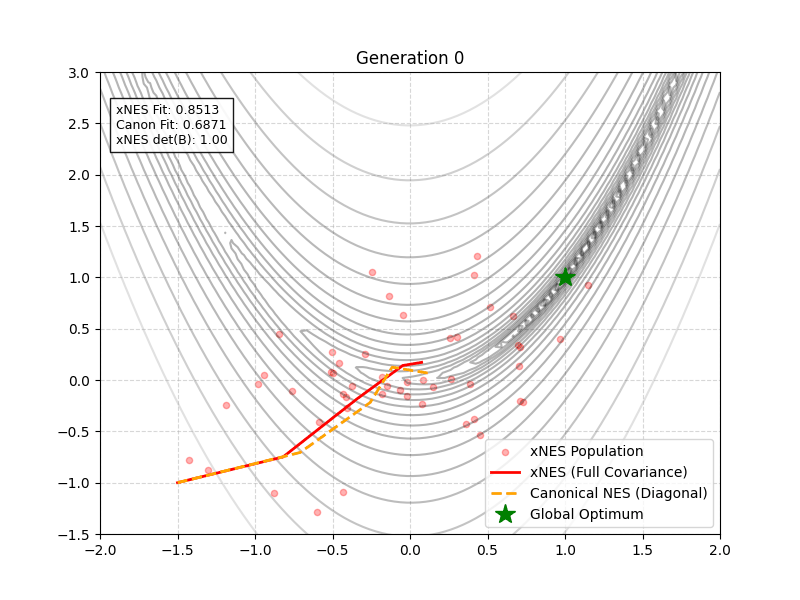

In [4]:
import numpy as np
import scipy.linalg
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

def f(x):
    # Rosenbrock
    return (1 - x[0])**2 + 100 * (x[1] - x[0]**2)**2

dim = 2
n_pop = 50

# xNES parameter
lr_mu_xnes = 1.0
lr_sigma_xnes = 0.5
lr_B_xnes = 0.5
mu_xnes = np.array([-1.5, -1.0])
sigma_xnes = 0.5
B_xnes = np.eye(dim)

# NES parameter
lr_mu_can = 1.0
lr_sigma_can = 0.5
mu_can = np.array([-1.5, -1.0])
sigma_can = np.array([0.5, 0.5])

# Utilities
utilities = np.zeros(n_pop)
for i in range(n_pop):
    utilities[i] = np.log(n_pop / 2 + 1) - np.log(i + 1)
utilities = np.maximum(0, utilities)
utilities = utilities / np.sum(utilities) - 1/n_pop

# History
path_x_xnes, path_y_xnes = [mu_xnes[0]], [mu_xnes[1]]
path_x_can, path_y_can = [mu_can[0]], [mu_can[1]]

fig, ax = plt.subplots(figsize=(8, 6))
ax.set_xlim(-2, 2)
ax.set_ylim(-1.5, 3)

x_grid = np.linspace(-2, 2, 100)
y_grid = np.linspace(-2, 3, 100)
X, Y = np.meshgrid(x_grid, y_grid)
Z = (1 - X)**2 + 100 * (Y - X**2)**2
ax.contour(X, Y, Z, levels=np.logspace(-1, 3, 20), cmap='gray', alpha=0.3)

scat_xnes = ax.scatter([], [], c='red', alpha=0.3, s=20, label='xNES Population')
line_xnes, = ax.plot([], [], 'r-', lw=2, label='xNES (Full Covariance)')

line_can, = ax.plot([], [], 'orange', linestyle='--', lw=2, label='Canonical NES (Diagonal)')

target, = ax.plot(1, 1, 'g*', ms=15, label='Global Optimum')
title_text = ax.set_title("", fontsize=12)
param_text = ax.text(-1.9, 2.3, "", fontsize=9, bbox=dict(facecolor='white', alpha=0.9))

ax.legend(loc='lower right')
ax.grid(True, linestyle='--', alpha=0.5)

def update(frame):
    global mu_xnes, sigma_xnes, B_xnes, mu_can, sigma_can
    global path_x_xnes, path_y_xnes, path_x_can, path_y_can

    # ===========================
    # xNES
    # ===========================
    z = np.random.randn(n_pop, dim)
    x = mu_xnes + sigma_xnes * (B_xnes @ z.T).T

    fitness = np.array([f(ind) for ind in x])
    ranks = np.argsort(fitness)
    z_sorted = z[ranks]
    best_fit_xnes = fitness[ranks[0]]

    # Gradients xNES
    G_delta = np.dot(utilities, z_sorted)
    G_M = np.zeros((dim, dim))
    for i in range(n_pop):
        G_M += utilities[i] * (np.outer(z_sorted[i], z_sorted[i]) - np.eye(dim))
    G_sigma = np.trace(G_M) / dim
    G_B = G_M - G_sigma * np.eye(dim)

    # Update xNES
    mu_xnes = mu_xnes + lr_mu_xnes * sigma_xnes * (B_xnes @ G_delta)
    sigma_xnes = sigma_xnes * np.exp(lr_sigma_xnes / 2 * G_sigma)
    B_xnes = B_xnes @ scipy.linalg.expm(lr_B_xnes / 2 * G_B)

    # ==========================================
    # Canonical NES
    # ==========================================
    z_can = np.random.randn(n_pop, dim)
    x_can = mu_can + sigma_can * z_can

    fitness_can = np.array([f(ind) for ind in x_can])
    ranks_can = np.argsort(fitness_can)
    z_sorted_can = z_can[ranks_can]

    grad_mu_can = np.dot(utilities, z_sorted_can)
    grad_sigma_can = np.dot(utilities, (z_sorted_can**2 - 1))

    mu_can = mu_can + lr_mu_can * sigma_can * grad_mu_can
    sigma_can = sigma_can * np.exp(lr_sigma_can / 2 * grad_sigma_can)

    # ===========================
    # UPDATE
    # ===========================
    path_x_xnes.append(mu_xnes[0])
    path_y_xnes.append(mu_xnes[1])

    path_x_can.append(mu_can[0])
    path_y_can.append(mu_can[1])

    scat_xnes.set_offsets(x)
    line_xnes.set_data(path_x_xnes, path_y_xnes)
    line_can.set_data(path_x_can, path_y_can)

    title_text.set_text(f"Generation {frame}")
    info = (f"xNES Fit: {best_fit_xnes:.4f}\n"
            f"Canon Fit: {fitness_can.min():.4f}\n"
            f"xNES det(B): {np.linalg.det(B_xnes):.2f}")
    param_text.set_text(info)

    return scat_xnes, line_xnes, line_can, title_text, param_text

# GIF
print("Đang tạo GIF so sánh (khoảng 20s)...")
ani = FuncAnimation(fig, update, frames=80, interval=150, blit=True)

output_filename = "comparison_xnes_vs_canonical.gif"
ani.save(output_filename, writer=PillowWriter(fps=3))

print(f"Hoàn tất! File: {output_filename}")
plt.close()

display(Image(filename=output_filename))

# 4.2 THỰC NGHIỆM VỚI HÀM RASTRIGIN


In [5]:
!pip install cma

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.5/309.5 kB 6.2 MB/s eta 0:00:00


Đang chạy thuật toán xNES...
Đang chạy Gradient Descent...
Đang chạy CMA-ES...
(25_w,50)-aCMA-ES (mu_w=14.0,w_1=14%) in dimension 2 (seed=687278, Mon Jan  5 03:45:38 2026)


/usr/local/lib/python3.12/dist-packages/cma/evolution_strategy.py:2516: UserWarning: function_values is not a list of scalars,
                        the first element equals [54.47390749] with non-scalar type <class 'numpy.ndarray'>.
                        Using now ``[v[0] for v in function_values]`` instead (further warnings are suppressed) (time=Jan  5 03:45:38 2026)
  ); m and warnings.warn(m)
/usr/local/lib/python3.12/dist-packages/cma/evolution_strategy.py:2516: UserWarning: function_values is not a list of scalars,
                        the first element equals [97.533772] with non-scalar type <class 'numpy.ndarray'>.
                        Using now ``[v[0] for v in function_values]`` instead (further warnings are suppressed) (time=Jan  5 03:45:38 2026)
  ); m and warnings.warn(m)


Đang render GIF so sánh (sẽ mất vài giây)...
Đã xong! File 'xnes_vs_others.gif' đã được tạo.


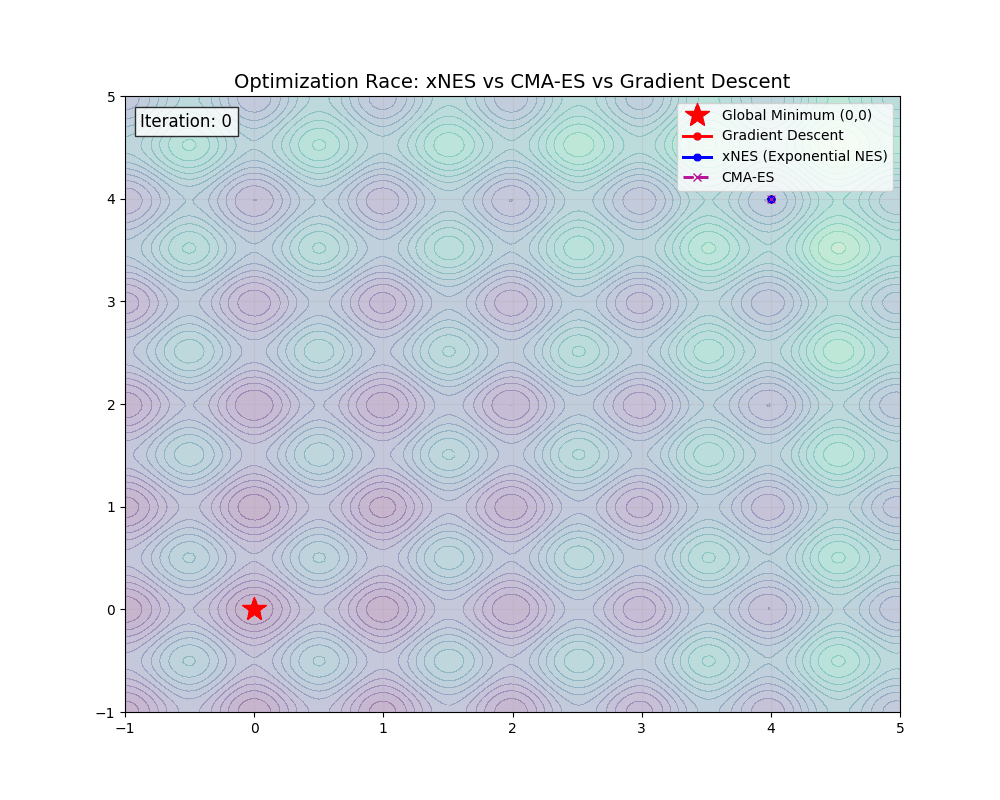

In [6]:
!pip install cma
import numpy as np
import matplotlib.pyplot as plt
import cma
import scipy.linalg
from matplotlib.animation import FuncAnimation, PillowWriter

def rastrigin(x):
    x = np.atleast_2d(x)
    d = x.shape[-1]
    return 10 * d + np.sum(x**2 - 10 * np.cos(2 * np.pi * x), axis=-1)

def rastrigin_grad(x):
    return 2 * x + 20 * np.pi * np.sin(2 * np.pi * x)

# --- 2. Thuật toán xNES (Exponential Natural Evolution Strategies) ---
def run_xnes(dim=2, iterations=60, pop_size=50):
    # Khởi tạo tham số
    mu = np.array([4.0, 4.0])
    sigma = 1.0
    B = np.eye(dim)

    eta_mu = 1.0
    eta_sigma = 3 * (3 + np.log(dim)) / (5 * dim * np.sqrt(dim))
    eta_B = 3 * (3 + np.log(dim)) / (5 * dim * np.sqrt(dim))

    history_mu = [mu.copy()]

    # Tính Utilities - cố định
    weights = np.log(pop_size / 2 + 1) - np.log(np.arange(1, pop_size + 1))
    weights = np.maximum(0, weights)
    weights = weights / np.sum(weights) - 1/pop_size

    for _ in range(iterations):
        # 1. Sampling & Mapping
        z = np.random.randn(pop_size, dim)
        # x = mu + sigma * (B @ z)
        x = mu + sigma * (B @ z.T).T

        # 2. Evaluation & Ranking
        fitness = rastrigin(x)
        indices = np.argsort(fitness)
        z_sorted = z[indices]

        # 3. Tính Natural Gradients
        G_delta = np.dot(weights, z_sorted)

        G_M = np.zeros((dim, dim))
        for i in range(pop_size):
            G_M += weights[i] * (np.outer(z_sorted[i], z_sorted[i]) - np.eye(dim))

        G_sigma = np.trace(G_M) / dim
        G_B = G_M - G_sigma * np.eye(dim)

        # 4. Cập nhật Tham số (Update Rules của xNES)
        mu += eta_mu * sigma * (B @ G_delta)

        # Cập nhật sigma (Exponential update)
        sigma *= np.exp(0.5 * eta_sigma * G_sigma)

        # Cập nhật B (Exponential Map update)
        B = B @ scipy.linalg.expm(0.5 * eta_B * G_B)

        history_mu.append(mu.copy())

    return np.array(history_mu)

def run_gd(dim=2, iterations=60, lr=0.005):
    x = np.array([4.0, 4.0])
    history = [x.copy()]
    for _ in range(iterations):
        grad = rastrigin_grad(x)
        x = x - lr * grad
        history.append(x.copy())
    return np.array(history)

def run_cmaes(dim=2, iterations=60):
    es = cma.CMAEvolutionStrategy(dim * [4.0], 1.0, {'popsize': 50, 'verb_log': 0})
    history_mu = [np.array([4.0, 4.0])]

    for _ in range(iterations):
        if es.stop():
            break
        solutions = es.ask()
        es.tell(solutions, [rastrigin(x) for x in solutions])
        history_mu.append(es.mean.copy())

    return np.array(history_mu)

N_ITER = 80
print("Đang chạy thuật toán xNES...")
hist_xnes = run_xnes(iterations=N_ITER)
print("Đang chạy Gradient Descent...")
hist_gd = run_gd(iterations=N_ITER)
print("Đang chạy CMA-ES...")
hist_cma = run_cmaes(iterations=N_ITER)

fig, ax = plt.subplots(figsize=(10, 8))
ax.set_xlim(-1, 5)
ax.set_ylim(-1, 5)
ax.set_title("Optimization Race: xNES vs CMA-ES vs Gradient Descent", fontsize=14)


x_range = np.linspace(-1.5, 5.5, 200)
y_range = np.linspace(-1.5, 5.5, 200)
X, Y = np.meshgrid(x_range, y_range)
Z = 10 * 2 + (X**2 - 10 * np.cos(2 * np.pi * X)) + (Y**2 - 10 * np.cos(2 * np.pi * Y))
ax.contourf(X, Y, Z, levels=30, cmap='viridis', alpha=0.3)
ax.plot(0, 0, 'r*', markersize=18, label='Global Minimum (0,0)', zorder=10)

line_gd, = ax.plot([], [], 'r-o', lw=2, markersize=5, label='Gradient Descent')
line_xnes, = ax.plot([], [], 'b-o', lw=2, markersize=5, label='xNES (Exponential NES)')
line_cma, = ax.plot([], [], 'm--x', lw=2, markersize=6, label='CMA-ES')

iter_text = ax.text(0.02, 0.95, '', transform=ax.transAxes, fontsize=12,
                    bbox=dict(facecolor='white', alpha=0.8))

ax.legend(loc='upper right')
ax.grid(True, alpha=0.3)

def update(frame):
    # GD
    curr_gd = min(frame, len(hist_gd)-1)
    line_gd.set_data(hist_gd[:curr_gd+1, 0], hist_gd[:curr_gd+1, 1])

    # xNES (Thay đổi biến hist_nes thành hist_xnes)
    curr_xnes = min(frame, len(hist_xnes)-1)
    line_xnes.set_data(hist_xnes[:curr_xnes+1, 0], hist_xnes[:curr_xnes+1, 1])

    # CMA-ES
    curr_cma = min(frame, len(hist_cma)-1)
    line_cma.set_data(hist_cma[:curr_cma+1, 0], hist_cma[:curr_cma+1, 1])

    iter_text.set_text(f"Iteration: {frame}")
    return line_gd, line_xnes, line_cma, iter_text

print("Đang render GIF so sánh (sẽ mất vài giây)...")
ani = FuncAnimation(fig, update, frames=N_ITER+1, interval=150, blit=True)
ani.save("xnes_vs_others.gif", writer=PillowWriter(fps=5)) # FPS 5 cho chậm
print("Đã xong! File 'xnes_vs_others.gif' đã được tạo.")
plt.close()

from IPython.display import Image
Image(filename="xnes_vs_others.gif")